In [1]:
# ипрортируем библиотеки

import numpy as np
import pandas as pd
import missingno as msn
import matplotlib.pyplot as plt
import ydata_profiling
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score,  classification_report,accuracy_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier

C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [2]:
# загружаем набор данных
Pogoda = pd.read_excel('C://Users/alex1/Downloads/Pogoda (1).xlsx')
DataDTPкор = pd.read_excel('C://Users/alex1/Downloads/DataDTPкор (1).xlsx')

merged_df = pd.merge(Pogoda, DataDTPкор, on='join_key')
#Посмотрел датафрейм
merged_df

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,pogoda_region,region_y,address,category,datetime_y,severity,dead_count,injured_count,parent_region,participants_count
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,Восток,Перово,"г Москва, ш Энтузиастов, 40",Столкновение,2016-12-31 22:50:00,Легкий,0,2,Москва,3
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,Восток,Ивановское,"г Москва, ул Молостовых, 4к4",Наезд на пешехода,2017-01-01 18:30:00,Легкий,0,1,Москва,2
2,"Восток43101,125",2018-01-01 03:00:00,2018,1,Восток,1.1,761.2,80.0,"Штиль, безветрие",0.0,...,Восток,Гольяново,"г Москва, ул Камчатская, 6к2",Наезд на пешехода,2018-01-01 02:40:00,Тяжёлый,0,1,Москва,2
3,"Восток43101,25",2018-01-01 06:00:00,2018,1,Восток,0.2,761.3,90.0,"Штиль, безветрие",0.0,...,Восток,Восточное Измайлово,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2018-01-01 06:50:00,Легкий,0,1,Москва,3
4,"Восток43101,375",2018-01-01 09:00:00,2018,1,Восток,1.3,760.9,83.0,Ю,1.0,...,Восток,Новокосино,"г Москва, ул Новокосинская, 15",Столкновение,2018-01-01 08:05:00,Легкий,0,1,Москва,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35015,"Юго-запад43830,5",2019-12-31 12:00:00,2019,12,Юго-запад,1.0,744.7,93.0,ЗЮЗ,6.0,...,Юго-запад,Теплый Стан,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2019-12-31 12:20:00,Тяжёлый,0,2,Москва,4
35016,"Юго-запад43830,75",2019-12-31 18:00:00,2019,12,Юго-запад,2.0,744.0,87.0,ЗЮЗ,6.0,...,Юго-запад,Южное Бутово,NaN,Наезд на пешехода,2019-12-31 17:00:00,Легкий,0,1,Москва,2
35017,"Юго-запад43830,875",2019-12-31 21:00:00,2019,12,Юго-запад,2.0,744.7,87.0,ЗЮЗ,6.0,...,Юго-запад,Гагаринский,"г Москва, пр-кт Ленинский, 40",Наезд на пешехода,2019-12-31 22:20:00,Легкий,0,1,Москва,2
35018,"Юго-запад44196,125",2020-12-31 03:00:00,2020,12,Юго-запад,-4.0,764.3,93.0,ВЮВ,6.0,...,Юго-запад,Теплый Стан,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2020-12-31 02:45:00,Тяжёлый,0,2,Москва,5


In [210]:
merged_df.columns

Index(['join_key', 'datetime_x', 'year', 'month', 'region_x', 'temperature',
       'atmospheric pressure', 'humidity', 'Direction of the wind',
       'Wind speed', 'cloudiness', 'weather conditions', 'datetime_round',
       'id', 'light', 'point', 'pogoda_region', 'region_y', 'address',
       'category', 'datetime_y', 'severity', 'dead_count', 'injured_count',
       'parent_region', 'participants_count'],
      dtype='object')

In [64]:
merged_df.shape

(35020, 26)

In [3]:
merged_df = merged_df.drop_duplicates()
merged_df.shape


(35015, 26)

In [67]:
merged_df.describe()

,year,month,temperature,atmospheric pressure,humidity,Wind speed,cloudiness,id,dead_count,injured_count,participants_count
count,35015.000000,35015.000000,35010.000000,35014.000000,35008.000000,35011.000000,35015.000000,3.501500e+04,35015.000000,35015.000000,35015.000000
mean,2019.110524,6.869884,8.530563,761.729888,70.499914,1.994259,0.646410,1.844358e+06,0.042382,1.132600,2.420163
std,1.351874,3.412758,10.571064,7.688128,20.073778,1.750487,0.403069,4.616067e+05,0.218203,0.579572,0.890962
min,2017.000000,1.000000,-27.700000,724.700000,11.000000,0.000000,0.000000,1.527478e+06,0.000000,0.000000,1.000000
25%,2018.000000,4.000000,0.800000,756.900000,56.000000,1.000000,0.250000,1.542544e+06,0.000000,1.000000,2.000000
50%,2019.000000,7.000000,8.000000,761.600000,75.000000,2.000000,0.750000,1.558565e+06,0.000000,1.000000,2.000000
75%,2020.000000,10.000000,17.200000,766.600000,87.000000,3.000000,1.000000,2.498060e+06,0.000000,1.000000,3.000000
max,2021.000000,12.000000,35.100000,787.900000,100.000000,15.000000,1.000000,2.648998e+06,4.000000,19.000000,20.000000


In [29]:
from sklearn.svm import OneClassSVM
import pandas as pd
from sklearn.preprocessing import StandardScaler
mmm = merged_df.copy()
mmm.dropna(inplace=True)

# Выбор признаков для модели
features = ['temperature', 'atmospheric pressure', 'humidity', 'Wind speed']

# Нормализация данных
scaler = StandardScaler()
mmm[features] = scaler.fit_transform(mmm[features])

# Обучение модели One-Class SVM
model = OneClassSVM(nu=0.05)  # параметр nu можно настраивать
model.fit(mmm[features])

# Предсказание аномалий
mmm['anomaly'] = model.predict(mmm[features])
anomalies = mmm[mmm['anomaly'] == -1]

# Вывод аномалий
print(anomalies)

                 join_key           datetime_x  year  month   region_x  \
82            Восток43282  2018-07-01 00:00:00  2018      7     Восток   
88        Восток43647,875  2019-07-01 21:00:00  2019      7     Восток   
249        Восток43314,25  2018-08-02 06:00:00  2018      8     Восток   
250        Восток43314,25  2018-08-02 06:00:00  2018      8     Восток   
358        Восток43588,75  2019-05-03 18:00:00  2019      5     Восток   
...                   ...                  ...   ...    ...        ...   
34961   Юго-запад44530,25  2021-11-30 06:00:00  2021     11  Юго-запад   
34962   Юго-запад44530,75  2021-11-30 18:00:00  2021     11  Юго-запад   
34964   Юго-запад43829,75  2019-12-30 18:00:00  2019     12  Юго-запад   
34965   Юго-запад43829,75  2019-12-30 18:00:00  2019     12  Юго-запад   
35005  Юго-запад43404,625  2018-10-31 15:00:00  2018     10  Юго-запад   

       temperature  atmospheric pressure  humidity Direction of the wind  \
82        1.168575             -1.2

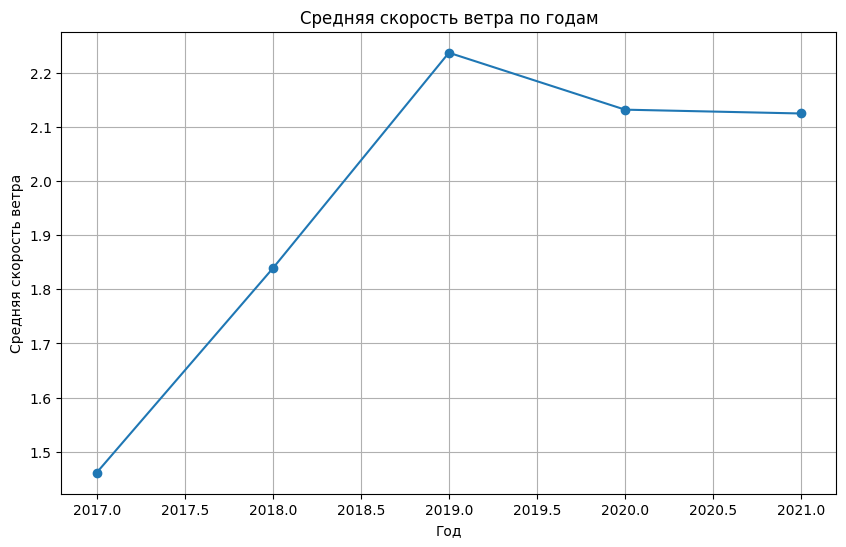

In [4]:
# Группировка данных по годам и вычисление средней скорости ветра
average_wind_speed = merged_df.groupby('year')['Wind speed'].mean()

# Создание графика
plt.figure(figsize=(10, 6))
plt.plot(average_wind_speed.index, average_wind_speed.values, marker='o')
plt.title('Средняя скорость ветра по годам')
plt.xlabel('Год')
plt.ylabel('Средняя скорость ветра')
plt.grid(True)
plt.show()

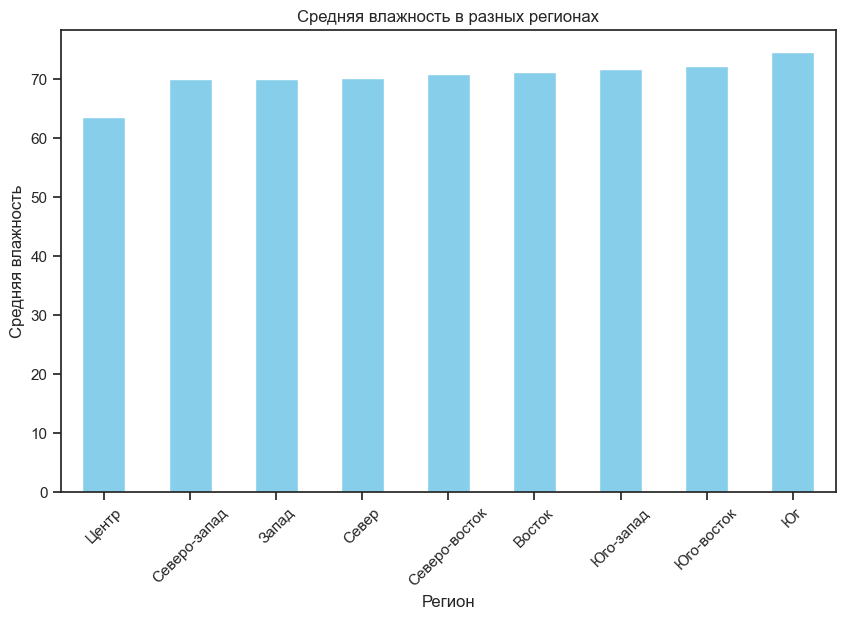

In [212]:
#Средняя влажность в регионах
avg_humidity_by_region = merged_df.groupby('region_x')['humidity'].mean().sort_values()

# Создание графика
plt.figure(figsize=(10, 6))
avg_humidity_by_region.plot(kind='bar', color='skyblue')
plt.title('Средняя влажность в разных регионах')
plt.xlabel('Регион')
plt.ylabel('Средняя влажность')
plt.xticks(rotation=45)
plt.show()

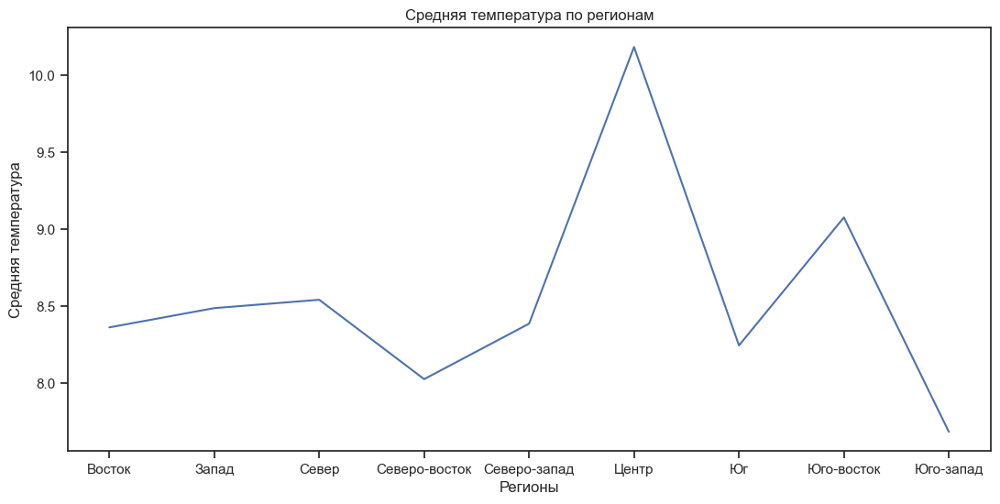

In [213]:
# Средняя температура по регионам
temp_mean = merged_df.groupby('region_x')['temperature'].mean()

plt.figure(figsize=(13, 6))
plt.plot(temp_mean.index, temp_mean.values)
plt.xlabel('Регионы')
plt.ylabel('Средняя температура')
plt.title('Средняя температура по регионам')
plt.show()

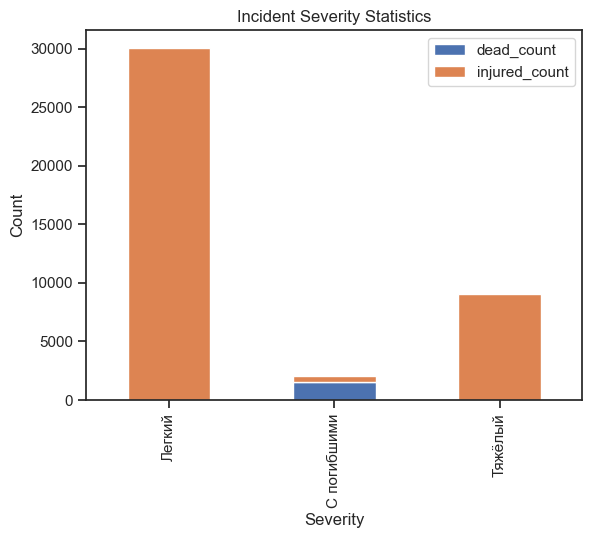

In [214]:
# Статистика по количеству пострадавших и погибших в происшествиях
incident_stats = merged_df.groupby('severity')[['dead_count', 'injured_count']].sum()
incident_stats.plot(kind='bar', stacked=True)
plt.title('Incident Severity Statistics')
plt.xlabel('Severity')
plt.ylabel('Count')
plt.show()

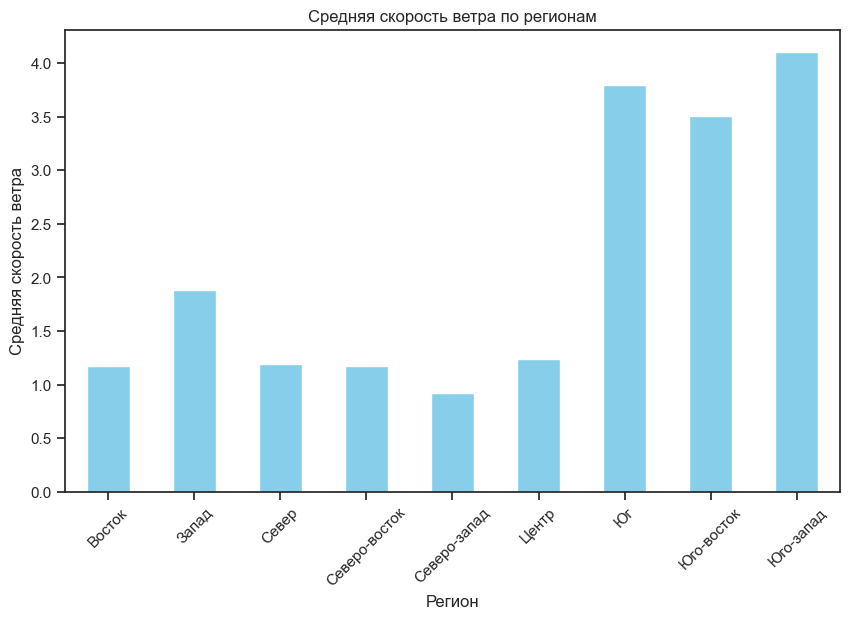

In [215]:
# Группировка данных по региону и вычисление средней скорости ветра
avg_wind_speed = merged_df.groupby('region_x')['Wind speed'].mean()

# Создание графика
plt.figure(figsize=(10, 6))
avg_wind_speed.plot(kind='bar', color='skyblue')
plt.title('Средняя скорость ветра по регионам')
plt.xlabel('Регион')
plt.ylabel('Средняя скорость ветра')
plt.xticks(rotation=45)
plt.show()
# Средняя скорость ветра

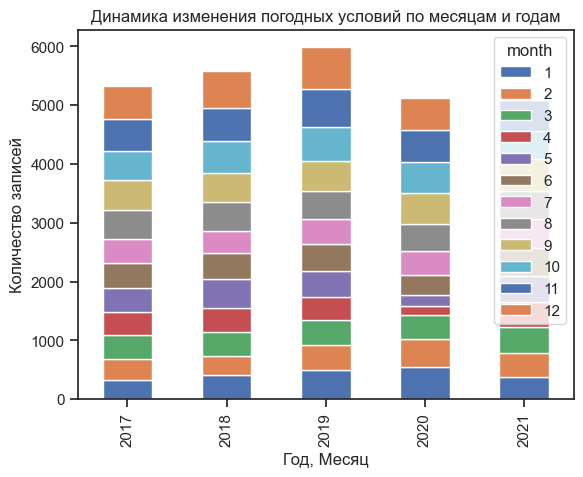

In [217]:
weather_conditions_count = merged_df.groupby(['year', 'month'])['weather conditions'].count().unstack()

# Создание графика
weather_conditions_count.plot(kind='bar', stacked=True)
plt.title('Динамика изменения погодных условий по месяцам и годам')
plt.xlabel('Год, Месяц')
plt.ylabel('Количество записей')
plt.show()

In [218]:
for i in merged_df['year'].unique():
    print(i)

2017
2018
2019
2020
2021


In [219]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35020 entries, 0 to 35019
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   join_key               35020 non-null  object        
 1   datetime_x             35020 non-null  object        
 2   year                   35020 non-null  int64         
 3   month                  35020 non-null  int64         
 4   region_x               35020 non-null  object        
 5   temperature            35015 non-null  float64       
 6   atmospheric pressure   35019 non-null  float64       
 7   humidity               35013 non-null  float64       
 8   Direction of the wind  35020 non-null  object        
 9   Wind speed             35016 non-null  float64       
 10  cloudiness             35020 non-null  float64       
 11  weather conditions     27106 non-null  object        
 12  datetime_round         35020 non-null  datetime64[ns]
 13  i

In [4]:
for column in merged_df.columns:
    nan_count = merged_df[column].isnull().sum()
    total_count = len(merged_df[column])
    percentage = nan_count/total_count*100
    print(f'Процент NaN значений в столбце {column} равен {percentage}%')
# вывод процента пропущеннных значений по столбцам  

Процент NaN значений в столбце join_key равен 0.0%
Процент NaN значений в столбце datetime_x равен 0.0%
Процент NaN значений в столбце year равен 0.0%
Процент NaN значений в столбце month равен 0.0%
Процент NaN значений в столбце region_x равен 0.0%
Процент NaN значений в столбце temperature равен 0.014277555682467162%
Процент NaN значений в столбце atmospheric pressure равен 0.0028555111364934323%
Процент NaN значений в столбце humidity равен 0.019988577955454025%
Процент NaN значений в столбце Direction of the wind равен 0.0%
Процент NaN значений в столбце Wind speed равен 0.011422044545973729%
Процент NaN значений в столбце cloudiness равен 0.0%
Процент NaN значений в столбце weather conditions равен 22.598515134209023%
Процент NaN значений в столбце datetime_round равен 0.0%
Процент NaN значений в столбце id равен 0.0%
Процент NaN значений в столбце light равен 0.0%
Процент NaN значений в столбце point равен 0.0%
Процент NaN значений в столбце pogoda_region равен 0.0%
Процент NaN з

In [9]:
merged_df.describe()

,year,month,temperature,atmospheric pressure,humidity,Wind speed,cloudiness,id,dead_count,injured_count,participants_count
count,35020.000000,35020.000000,35020.000000,35020.000000,35020.000000,35020.000000,35020.000000,3.502000e+04,35020.000000,35020.000000,35020.000000
mean,2019.110223,6.869046,8.528632,761.728538,70.507995,1.994089,0.646461,1.844319e+06,0.042376,1.132667,2.420246
std,1.352012,3.413235,10.570174,7.688224,20.075100,1.750311,0.403063,4.615857e+05,0.218188,0.579735,0.891117
min,2017.000000,1.000000,-27.700000,724.700000,11.000000,0.000000,0.000000,1.527478e+06,0.000000,0.000000,1.000000
25%,2018.000000,4.000000,0.800000,756.900000,56.000000,1.000000,0.250000,1.542545e+06,0.000000,1.000000,2.000000
50%,2019.000000,7.000000,8.000000,761.600000,75.000000,2.000000,0.750000,1.558604e+06,0.000000,1.000000,2.000000
75%,2020.000000,10.000000,17.200000,766.600000,87.000000,3.000000,1.000000,2.498059e+06,0.000000,1.000000,3.000000
max,2021.000000,12.000000,35.100000,787.900000,100.000000,15.000000,1.000000,2.648998e+06,4.000000,19.000000,20.000000


In [223]:
merged_df.head()

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,pogoda_region,region_y,address,category,datetime_y,severity,dead_count,injured_count,parent_region,participants_count
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,Восток,Перово,"г Москва, ш Энтузиастов, 40",Столкновение,2016-12-31 22:50:00,Легкий,0,2,Москва,3
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,Восток,Ивановское,"г Москва, ул Молостовых, 4к4",Наезд на пешехода,2017-01-01 18:30:00,Легкий,0,1,Москва,2
2,"Восток43101,125",2018-01-01 03:00:00,2018,1,Восток,1.1,761.2,80.0,"Штиль, безветрие",0.0,...,Восток,Гольяново,"г Москва, ул Камчатская, 6к2",Наезд на пешехода,2018-01-01 02:40:00,Тяжёлый,0,1,Москва,2
3,"Восток43101,25",2018-01-01 06:00:00,2018,1,Восток,0.2,761.3,90.0,"Штиль, безветрие",0.0,...,Восток,Восточное Измайлово,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2018-01-01 06:50:00,Легкий,0,1,Москва,3
4,"Восток43101,375",2018-01-01 09:00:00,2018,1,Восток,1.3,760.9,83.0,Ю,1.0,...,Восток,Новокосино,"г Москва, ул Новокосинская, 15",Столкновение,2018-01-01 08:05:00,Легкий,0,1,Москва,3


In [225]:
ydata_profiling.ProfileReport(merged_df)
# Визуализация data_profiling для описания основных характеристик и свойств данных.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
merged_df['datetime_x'] = pd.to_datetime(merged_df['datetime_x'], format='%y%m%d')

C:\Users\alex1\AppData\Local\Temp\ipykernel_8900\668187586.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['datetime_x'] = pd.to_datetime(merged_df['datetime_x'], format='%y%m%d')


In [6]:
dark_twilight_incidents = merged_df.copy()
dark_twilight_incidents = dark_twilight_incidents[dark_twilight_incidents['light'] != 'Светлое время суток']
dark_twilight_incidents.head()

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,pogoda_region,region_y,address,category,datetime_y,severity,dead_count,injured_count,parent_region,participants_count
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,Восток,Перово,"г Москва, ш Энтузиастов, 40",Столкновение,2016-12-31 22:50:00,Легкий,0,2,Москва,3
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,Восток,Ивановское,"г Москва, ул Молостовых, 4к4",Наезд на пешехода,2017-01-01 18:30:00,Легкий,0,1,Москва,2
2,"Восток43101,125",2018-01-01 03:00:00,2018,1,Восток,1.1,761.2,80.0,"Штиль, безветрие",0.0,...,Восток,Гольяново,"г Москва, ул Камчатская, 6к2",Наезд на пешехода,2018-01-01 02:40:00,Тяжёлый,0,1,Москва,2
3,"Восток43101,25",2018-01-01 06:00:00,2018,1,Восток,0.2,761.3,90.0,"Штиль, безветрие",0.0,...,Восток,Восточное Измайлово,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2018-01-01 06:50:00,Легкий,0,1,Москва,3
5,"Восток43466,125",2019-01-01 03:00:00,2019,1,Восток,-4.4,768.5,86.0,Ю,1.0,...,Восток,Северное Измайлово,"г Москва, ул Парковая 9-я, 60",Наезд на пешехода,2019-01-01 02:30:00,Легкий,0,2,Москва,3


In [7]:
dark_twilight_incidents['holiday'] = (dark_twilight_incidents['datetime_round'].dt.dayofweek >= 5).astype(int)

In [8]:
dark_twilight_incidents[dark_twilight_incidents['holiday'] == 1]

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,region_y,address,category,datetime_y,severity,dead_count,injured_count,parent_region,participants_count,holiday
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,Перово,"г Москва, ш Энтузиастов, 40",Столкновение,2016-12-31 22:50:00,Легкий,0,2,Москва,3,1
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,Ивановское,"г Москва, ул Молостовых, 4к4",Наезд на пешехода,2017-01-01 18:30:00,Легкий,0,1,Москва,2,1
27,"Восток43862,75",2020-02-01 18:00:00,2020,2,Восток,-0.3,754.2,89.0,ЮЮВ,1.0,...,Сокольники,"г Москва, ул Стромынка, 9",Наезд на пешехода,2020-02-01 18:58:00,Легкий,0,1,Москва,2,1
35,"Восток43891,25",2020-03-01 06:00:00,2020,3,Восток,-2.0,759.4,90.0,"Штиль, безветрие",0.0,...,Соколиная гора,"г Москва, ш Энтузиастов, 29",Наезд на пешехода,2020-03-01 04:30:00,Легкий,0,1,Москва,2,1
38,"Восток43891,875",2020-03-01 21:00:00,2020,3,Восток,4.9,756.2,61.0,Ю,1.0,...,Метрогородок,"г Москва, ш Открытое, 25, к.1",Наезд на пешехода,2020-03-01 22:10:00,Легкий,0,2,Москва,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34980,"Юго-запад43555,125",2019-03-31 03:00:00,2019,3,Юго-запад,4.0,757.7,81.0,ЮЗ,3.0,...,Южное Бутово,"г Москва, ул Поляны, 9",Наезд на пешехода,2019-03-31 01:34:00,Легкий,0,1,Москва,2,1
34991,Юго-запад43708,2019-08-31 00:00:00,2019,8,Юго-запад,13.0,765.8,77.0,ЮВ,1.0,...,Ясенево,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2019-08-30 23:50:00,Легкий,0,1,Москва,2,1
34994,"Юго-запад43708,875",2019-08-31 21:00:00,2019,8,Юго-запад,18.0,765.0,60.0,"Штиль, безветрие",0.0,...,Черемушки,"г Москва, ул Профсоюзная, 33 к.1, двор, 2 под.",Наезд на пешехода,2019-08-31 20:15:00,Легкий,0,2,Москва,2,1
35007,"Юго-запад44135,875",2020-10-31 21:00:00,2020,10,Юго-запад,5.0,766.6,87.0,ССВ,4.0,...,Гагаринский,"г Москва, ул Дмитрия Ульянова, 3",Столкновение,2020-10-31 20:40:00,Легкий,0,1,Москва,3,1


In [9]:
categorical_columns = ['region_x', 'Direction of the wind', 'light', 'weather conditions','Direction of the wind']

df_encoded = pd.get_dummies(dark_twilight_incidents, columns=categorical_columns)

numeric_columns = ['temperature', 'humidity', 'Wind speed']
dark_twilight_incidents[numeric_columns] = dark_twilight_incidents[numeric_columns].fillna(dark_twilight_incidents[numeric_columns].mean())

In [37]:
dark_twilight_incidents

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,region_y,address,category,datetime_y,severity,dead_count,injured_count,parent_region,participants_count,holiday
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,Перово,"г Москва, ш Энтузиастов, 40",Столкновение,2016-12-31 22:50:00,Легкий,0,2,Москва,3,1
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,Ивановское,"г Москва, ул Молостовых, 4к4",Наезд на пешехода,2017-01-01 18:30:00,Легкий,0,1,Москва,2,1
2,"Восток43101,125",2018-01-01 03:00:00,2018,1,Восток,1.1,761.2,80.0,"Штиль, безветрие",0.0,...,Гольяново,"г Москва, ул Камчатская, 6к2",Наезд на пешехода,2018-01-01 02:40:00,Тяжёлый,0,1,Москва,2,0
3,"Восток43101,25",2018-01-01 06:00:00,2018,1,Восток,0.2,761.3,90.0,"Штиль, безветрие",0.0,...,Восточное Измайлово,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2018-01-01 06:50:00,Легкий,0,1,Москва,3,0
5,"Восток43466,125",2019-01-01 03:00:00,2019,1,Восток,-4.4,768.5,86.0,Ю,1.0,...,Северное Измайлово,"г Москва, ул Парковая 9-я, 60",Наезд на пешехода,2019-01-01 02:30:00,Легкий,0,2,Москва,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35013,"Юго-запад43830,25",2019-12-31 06:00:00,2019,12,Юго-запад,0.0,746.3,93.0,ЗЮЗ,6.0,...,Теплый Стан,"г Москва, Московская кольцевая автомобильная д...",Наезд на стоящее ТС,2019-12-31 04:42:00,Легкий,0,1,Москва,4,0
35015,"Юго-запад43830,5",2019-12-31 12:00:00,2019,12,Юго-запад,1.0,744.7,93.0,ЗЮЗ,6.0,...,Теплый Стан,"г Москва, Московская кольцевая автомобильная д...",Столкновение,2019-12-31 12:20:00,Тяжёлый,0,2,Москва,4,0
35016,"Юго-запад43830,75",2019-12-31 18:00:00,2019,12,Юго-запад,2.0,744.0,87.0,ЗЮЗ,6.0,...,Южное Бутово,"г Москва, Московская кольцевая автомобильная д...",Наезд на пешехода,2019-12-31 17:00:00,Легкий,0,1,Москва,2,0
35017,"Юго-запад43830,875",2019-12-31 21:00:00,2019,12,Юго-запад,2.0,744.7,87.0,ЗЮЗ,6.0,...,Гагаринский,"г Москва, пр-кт Ленинский, 40",Наезд на пешехода,2019-12-31 22:20:00,Легкий,0,1,Москва,2,0


C:\Users\alex1\AppData\Local\Temp\ipykernel_8900\2954848814.py:8: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  dark_twilight_incidents['week'] = dark_twilight_incidents['datetime_x'].dt.week


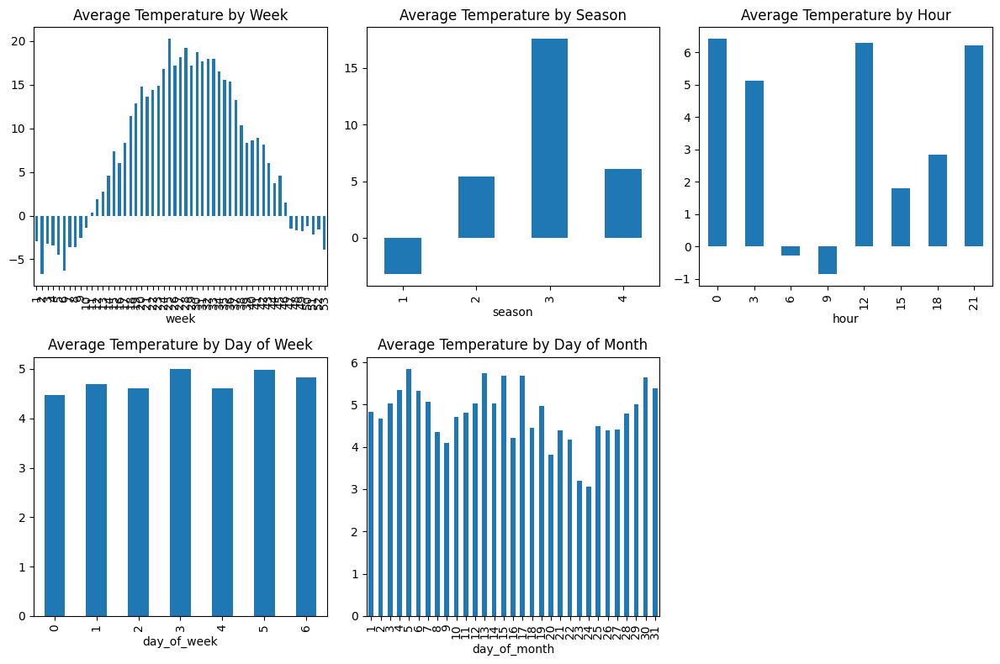

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Приведем столбец 'datetime_x' к типу datetime, если он еще не в таком формате
dark_twilight_incidents['datetime_x'] = pd.to_datetime(dark_twilight_incidents['datetime_x'])

# Создаем новые столбцы для недели, сезона, часа, дня недели и дня месяца
dark_twilight_incidents['week'] = dark_twilight_incidents['datetime_x'].dt.week
dark_twilight_incidents['season'] = (dark_twilight_incidents['datetime_x'].dt.month%12 + 3)//3
dark_twilight_incidents['hour'] = merged_df['datetime_x'].dt.hour
dark_twilight_incidents['day_of_week'] = dark_twilight_incidents['datetime_x'].dt.dayofweek
dark_twilight_incidents['day_of_month'] = dark_twilight_incidents['datetime_x'].dt.day

# Группируем данные по уникальным значениям этих параметров и находим среднюю температуру
avg_temp_by_week = dark_twilight_incidents.groupby('week')['temperature'].mean()
avg_temp_by_season = dark_twilight_incidents.groupby('season')['temperature'].mean()
avg_temp_by_hour = dark_twilight_incidents.groupby('hour')['temperature'].mean()
avg_temp_by_day_of_week = dark_twilight_incidents.groupby('day_of_week')['temperature'].mean()
avg_temp_by_day_of_month = dark_twilight_incidents.groupby('day_of_month')['temperature'].mean()

# Строим графики
plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
avg_temp_by_week.plot(kind='bar', title='Average Temperature by Week')
plt.subplot(2, 3, 2)
avg_temp_by_season.plot(kind='bar', title='Average Temperature by Season')
plt.subplot(2, 3, 3)
avg_temp_by_hour.plot(kind='bar', title='Average Temperature by Hour')
plt.subplot(2, 3, 4)
avg_temp_by_day_of_week.plot(kind='bar', title='Average Temperature by Day of Week')
plt.subplot(2, 3, 5)
avg_temp_by_day_of_month.plot(kind='bar', title='Average Temperature by Day of Month')
plt.tight_layout()
plt.show()

In [233]:
dark_twilight_incidents.head()

,join_key,datetime_x,year,month,region_x,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,...,dead_count,injured_count,parent_region,participants_count,holiday,week,season,hour,day_of_week,day_of_month
0,Восток42736,2017-01-01 00:00:00,2017,1,Восток,0.9,755.2,96.0,ЗЮЗ,1.0,...,0,2,Москва,3,1,52,1,0,6,1
1,"Восток42736,75",2017-01-01 18:00:00,2017,1,Восток,1.7,751.0,96.0,ЗЮЗ,1.0,...,0,1,Москва,2,1,52,1,18,6,1
2,"Восток43101,125",2018-01-01 03:00:00,2018,1,Восток,1.1,761.2,80.0,"Штиль, безветрие",0.0,...,0,1,Москва,2,0,1,1,3,0,1
3,"Восток43101,25",2018-01-01 06:00:00,2018,1,Восток,0.2,761.3,90.0,"Штиль, безветрие",0.0,...,0,1,Москва,3,0,1,1,6,0,1
5,"Восток43466,125",2019-01-01 03:00:00,2019,1,Восток,-4.4,768.5,86.0,Ю,1.0,...,0,2,Москва,3,0,1,1,3,1,1


In [11]:
columns = ['join_key', 'datetime_x', 'year', 'pogoda_region', 'region_x','region_y', 'address', 'category', 'datetime_y', 'datetime_round', 'id','dead_count', 'injured_count', 'parent_region', 'participants_count', 'point','light' ]
dark_twilight_incidents_new = dark_twilight_incidents.drop(columns=columns)
dark_twilight_incidents_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14265 entries, 0 to 35018
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   month                  14265 non-null  int64  
 1   temperature            14265 non-null  float64
 2   atmospheric pressure   14265 non-null  float64
 3   humidity               14265 non-null  float64
 4   Direction of the wind  14265 non-null  object 
 5   Wind speed             14265 non-null  float64
 6   cloudiness             14265 non-null  float64
 7   weather conditions     11236 non-null  object 
 8   severity               14265 non-null  object 
 9   holiday                14265 non-null  int32  
 10  week                   14265 non-null  int64  
 11  season                 14265 non-null  int64  
 12  hour                   14265 non-null  int64  
 13  day_of_week            14265 non-null  int64  
 14  day_of_month           14265 non-null  int64  
dtypes:

In [12]:
label_endcoder = LabelEncoder()

for i in dark_twilight_incidents_new.columns:
 if type(dark_twilight_incidents_new[i][0]) == str:
     dark_twilight_incidents_new[i] = label_endcoder.fit_transform(dark_twilight_incidents_new[i])

dark_twilight_incidents_new

,month,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,cloudiness,weather conditions,severity,holiday,week,season,hour,day_of_week,day_of_month
0,1,0.9,755.2,96.0,5,1.0,1.00,19,0,1,52,1,0,6,1
1,1,1.7,751.0,96.0,5,1.0,1.00,6,0,1,52,1,18,6,1
2,1,1.1,761.2,80.0,12,0.0,1.00,0,2,0,1,1,3,0,1
3,1,0.2,761.3,90.0,12,0.0,1.00,19,0,0,1,1,6,0,1
5,1,-4.4,768.5,86.0,13,1.0,1.00,19,0,0,1,1,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35013,12,0.0,746.3,93.0,5,6.0,1.00,66,0,0,1,1,6,1,31
35015,12,1.0,744.7,93.0,5,6.0,1.00,94,2,0,1,1,12,1,31
35016,12,2.0,744.0,87.0,5,6.0,0.75,94,0,0,1,1,18,1,31
35017,12,2.0,744.7,87.0,5,6.0,1.00,94,0,0,1,1,21,1,31


In [41]:
dark_twilight_incidents_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14268 entries, 0 to 35018
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   month                  14268 non-null  int64  
 1   temperature            14268 non-null  float64
 2   atmospheric pressure   14268 non-null  float64
 3   humidity               14268 non-null  float64
 4   Direction of the wind  14268 non-null  int32  
 5   Wind speed             14268 non-null  float64
 6   cloudiness             14268 non-null  float64
 7   weather conditions     14268 non-null  int32  
 8   severity               14268 non-null  int32  
 9   holiday                14268 non-null  int32  
dtypes: float64(5), int32(4), int64(1)
memory usage: 1.5 MB


In [42]:
dark_twilight_incidents_new.head()

,month,temperature,atmospheric pressure,humidity,Direction of the wind,Wind speed,cloudiness,weather conditions,severity,holiday
0,1,0.9,755.2,96.0,5,1.0,1.0,19,0,1
1,1,1.7,751.0,96.0,5,1.0,1.0,6,0,1
2,1,1.1,761.2,80.0,12,0.0,1.0,0,2,0
3,1,0.2,761.3,90.0,12,0.0,1.0,19,0,0
5,1,-4.4,768.5,86.0,13,1.0,1.0,19,0,0


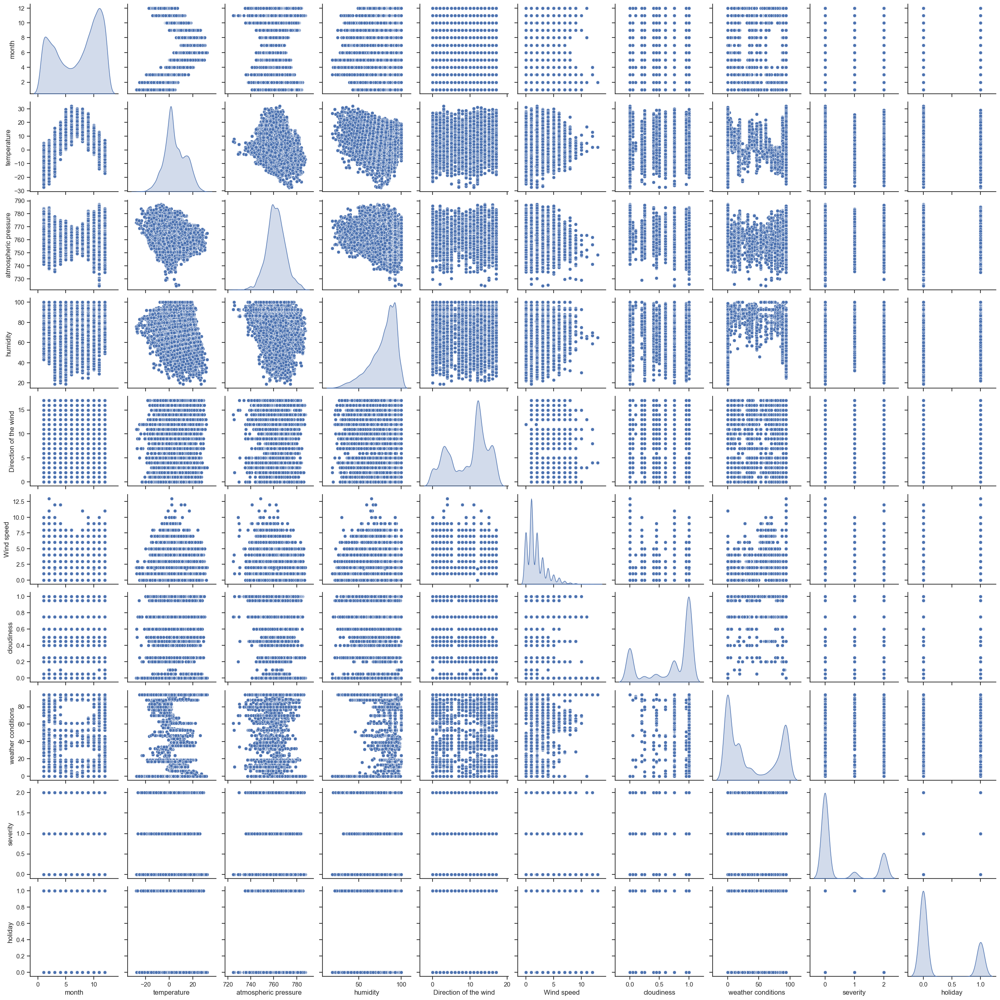

In [118]:
sns.set(style="ticks")
sns.pairplot(dark_twilight_incidents_new, diag_kind='kde')
plt.show()
# создание точечной диаграммы (pairplot)

In [13]:
X = dark_twilight_incidents_new.drop(columns=['severity'], axis = 1)
y = dark_twilight_incidents_new['severity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [14]:

model = LogisticRegression(max_iter = 1200)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)


classification_report_output = classification_report(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)
train_accuracy = model.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

0.7266035751840169
Точность обучения: 0.7298457763757449


C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [176]:
from sklearn.model_selection import RepeatedStratifiedKFold
from tpot import TPOTClassifier
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
tpot = TPOTClassifier(
    generations=5,
    population_size=50,
    scoring='accuracy',
    cv=cv,
    verbosity=2,
    random_state=1,
    n_jobs=-1
)

In [183]:
tpot.fit(X_train, y_train)

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.729425980528341

Generation 2 - Current best internal CV score: 0.729425980528341

Generation 3 - Current best internal CV score: 0.729425980528341

Generation 4 - Current best internal CV score: 0.729425980528341

Generation 5 - Current best internal CV score: 0.729425980528341

Best pipeline: DecisionTreeClassifier(input_matrix, criterion=gini, max_depth=3, min_samples_leaf=12, min_samples_split=20)


TPOTClassifier(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=1),
               generations=5, n_jobs=-1, population_size=50, random_state=1,
               scoring='accuracy', verbosity=2)

In [15]:
from sklearn.tree import DecisionTreeClassifier
best_model = DecisionTreeClassifier( max_depth=3, min_samples_leaf=12, min_samples_split=20)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

train_accuracy = best_model.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7259025587101297
Точность обучения: 0.7301962846126884


In [15]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive
from sklearn.model_selection import RepeatedKFold
from tpot import TPOTClassifier

C:\Users\alex1\AppData\Local\Programs\Python\Python310\lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [19]:
# обучение модели на основе catboost
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score

cat = CatBoostClassifier(loss_function='MultiClass',iterations=900, random_seed=42, learning_rate=0.01, depth=3)

cat.fit(X_train, y_train, verbose=100)

y_pred = cat.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
train_accuracy = cat.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

0:	learn: 1.0912184	total: 2.43ms	remaining: 2.18s
100:	learn: 0.7811341	total: 168ms	remaining: 1.33s
200:	learn: 0.7253138	total: 342ms	remaining: 1.19s
300:	learn: 0.7125885	total: 504ms	remaining: 1s
400:	learn: 0.7088601	total: 672ms	remaining: 836ms
500:	learn: 0.7069472	total: 850ms	remaining: 677ms
600:	learn: 0.7055490	total: 1.02s	remaining: 507ms
700:	learn: 0.7042662	total: 1.18s	remaining: 335ms
800:	learn: 0.7031272	total: 1.34s	remaining: 166ms
899:	learn: 0.7019972	total: 1.51s	remaining: 0us
Accuracy: 0.7266035751840169
Точность обучения: 0.7298457763757449


In [24]:
# обучение модели на основе градиентного бустинга

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.metrics import make_scorer

# Создайте модель градиентного бустинга
model = GradientBoostingClassifier()  # Можете настраивать количество деревьев и другие параметры
parameters = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 4, 5]}

# Обучение модели с использованием GridSearchCV
grid_search = GridSearchCV(model, parameters, scoring={'accuracy': make_scorer(accuracy_score)}, refit='accuracy', cv=3)
grid_search.fit(X_train, y_train)

# Получение результатов
best_estimator = grid_search.best_estimator_
best_params = grid_search.best_params_

# Оценка на тестовых данных

y_pred = grid_search.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
train_accuracy = grid_search.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7266035751840169
Точность обучения: 0.7298457763757449


In [23]:
from sklearn.svm import SVC
clf = SVC()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)
accuracy_gb = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy_gb}')
train_accuracy = clf.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7266035751840169
Точность обучения: 0.7298457763757449


In [22]:
from xgboost import XGBClassifier
bst = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1, objective='binary:logistic')
# fit model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
bst = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1, objective='binary:logistic')
# fit model
bst.fit(X_train, y_train)
# make predictions
preds = bst.predict(X_test)

accuracy_gb = accuracy_score(y_test, preds)
print(f'Accuracy: {accuracy_gb}')
train_accuracy = bst.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7266035751840169
Точность обучения: 0.7298457763757449


In [21]:
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)
accuracy_gb = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy_gb}')
train_accuracy = clf.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7178408692604277
Точность обучения: 0.7221345951629863


In [20]:
# обучение модели на основе рандомного леса
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

model = RandomForestClassifier(max_depth=5, random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
train_accuracy = model.score(X_train, y_train)

print(f'Точность обучения: {train_accuracy}')

Accuracy: 0.7266035751840169
Точность обучения: 0.7298457763757449


In [25]:
import shap
explainer_your_model = shap.Explainer(cat)
shap_values_your_model = explainer_your_model.shap_values(X_test)

# SHAP для TPOT модели
explainer_tpot = shap.Explainer(best_model)
shap_values_tpot = explainer_tpot.shap_values(X_test)

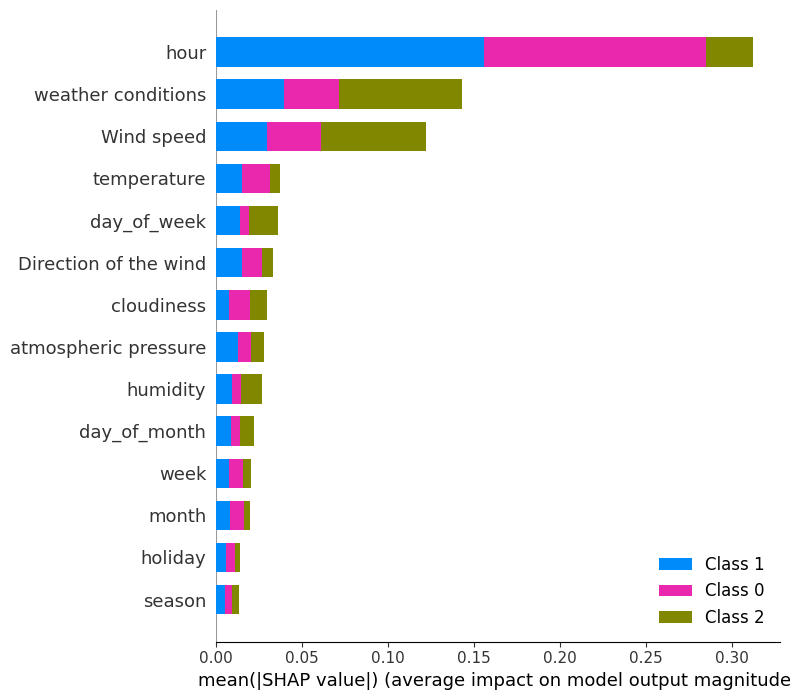

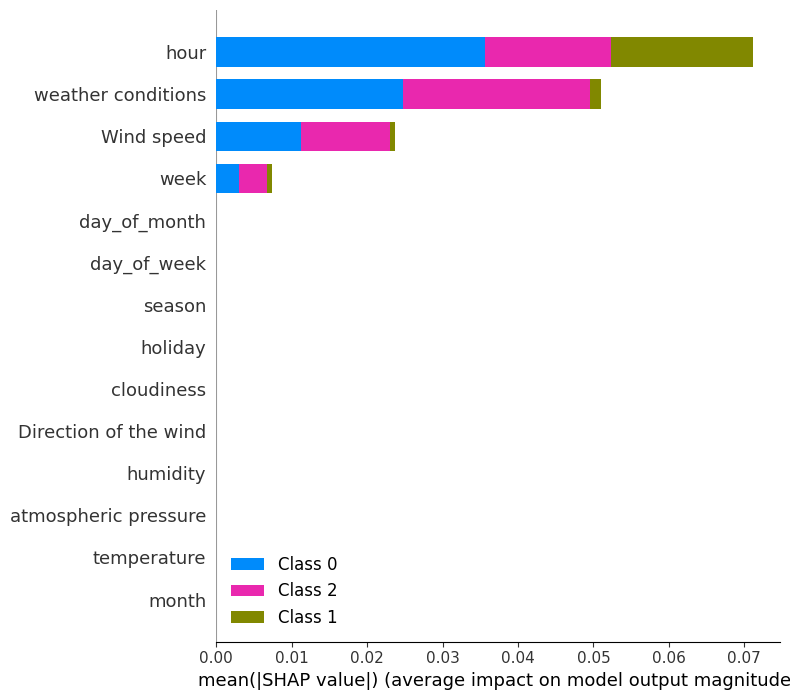

In [26]:
# График для нашей модели
shap.summary_plot(shap_values_your_model, X_test, plot_type="bar")

# График для TPOT модели
shap.summary_plot(shap_values_tpot, X_test, plot_type="bar")

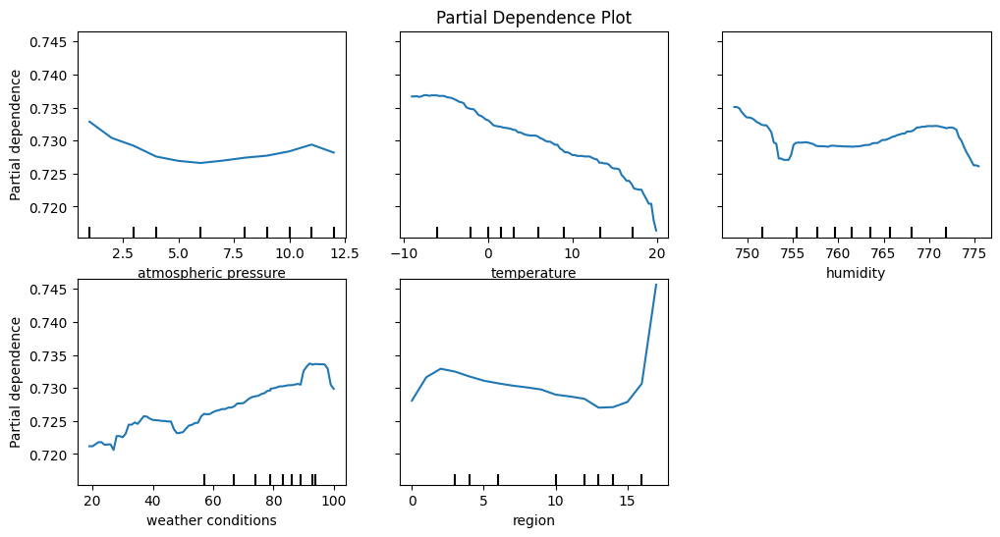

In [30]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

display = PartialDependenceDisplay.from_estimator(
    cat, X, ["atmospheric pressure", "temperature",'humidity','weather conditions', 'region'], feature_names=['atmospheric pressure', 'temperature','humidity','weather conditions','region'], ax=ax
    ,target=0
)


ax.set_title("Partial Dependence Plot")

plt.show()

In [27]:
import shap

explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(X_train)

shap.initjs()

instance = X_test.iloc[[0]]

shap_values_instance = explainer.shap_values(instance)

shap.force_plot(explainer.expected_value[0], shap_values_instance[0], instance)

In [28]:
import shap

explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(X_train)

shap.initjs()

instance = X_test.iloc[[20]]

shap_values_instance = explainer.shap_values(instance)

shap.force_plot(explainer.expected_value[0], shap_values_instance[0], instance)